# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [2]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

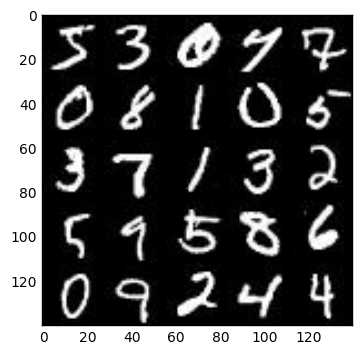

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

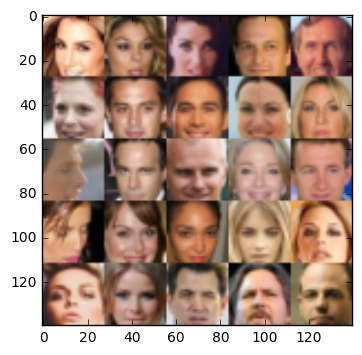

In [4]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [5]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.0.1
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [6]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    input_real = tf.placeholder(tf.float32, (None, image_width, image_height, image_channels))
    input_fake = tf.placeholder(tf.float32, (None, z_dim))
    learning_rate = tf.placeholder(tf.float32)
    
    return input_real, input_fake, learning_rate


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variabes in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [7]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param image: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function
    # Set alpha value
    alpha = 0.2
    
    image_channels = int(images.shape[3])

    # Use variable scope 
    with tf.variable_scope('discriminator', reuse= reuse):
        # First layer
        # Convolution
        x1 = tf.layers.conv2d(images, filters = 64, kernel_size = 5, strides = 2, padding = 'same', 
                              kernel_initializer=tf.contrib.layers.xavier_initializer_conv2d())
        # Activation function: Leaky ReLU
        act1 = tf.maximum(alpha * x1, x1)
        # Dropout
        drop1 = tf.nn.dropout(act1, keep_prob = 0.8)
        # Image shape = (14*14*64)
        
        # Second layer
        x2 = tf.layers.conv2d(act1, filters = 128, kernel_size = 5, strides = 2, padding = 'same', 
                              kernel_initializer=tf.contrib.layers.xavier_initializer_conv2d())
        # Batch Norm
        batch_norm2 = tf.layers.batch_normalization(x2, training = True)
        act2 = tf.maximum(alpha * batch_norm2, batch_norm2)
        drop2 = tf.nn.dropout(act2, keep_prob = 0.8)
        # Image shape = (7*7*128)
        
        # Third Layer
        x3 = tf.layers.conv2d(act2, filters = 256, kernel_size = 5, strides = 2, padding = 'same', 
                             kernel_initializer=tf.contrib.layers.xavier_initializer_conv2d())
        batch_norm3 = tf.layers.batch_normalization(x3, training = True)
        act3 = tf.maximum(alpha * batch_norm3, batch_norm3)
        drop3 = tf.nn.dropout(act3, keep_prob = 0.8)
        # Image shape = (4*4*256)
   
        # Flatten
        flatten = tf.reshape(act3, (-1, 4 * 4 * 256))
        
        logits = tf.layers.dense(flatten, 1)
        out = tf.sigmoid(logits)
        
    
    return logits, out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variabes in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [8]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    # Set alpha value
    alpha = 0.2
    
    if is_train:
        reuse = False
    else:
        reuse = True
        
    # Use variable scope 
    with tf.variable_scope('generator', reuse = reuse):
        # First layer
        # Project
        x1 = tf.layers.dense(z, 7 * 7 * 1024)
        # Reshape
        x1 = tf.reshape(x1, (-1, 7, 7, 1024))
        # Batch norm
        x1 = tf.layers.batch_normalization(x1, training = is_train)
        # Activation function = ReLU
#         x1 = tf.nn.relu(x1)
        x1 = tf.maximum(alpha * x1, x1)
        # x1 shape = (7x7x1024)

        # Second layer
        x2 = tf.layers.conv2d_transpose(x1, filters = 512, kernel_size = 5, strides = 1, padding = 'same',
                                        kernel_initializer=tf.contrib.layers.xavier_initializer_conv2d())
        x2 = tf.layers.batch_normalization(x2, training = is_train)
#         x2 = tf.nn.relu(x2)
        x2 = tf.maximum(alpha * x2, x2)
        # x2 shape = (7*7*512)

        # Third layer
        x3 = tf.layers.conv2d_transpose(x2, filters = 256, kernel_size = 5, strides = 2, padding = 'same', 
                                        kernel_initializer=tf.contrib.layers.xavier_initializer_conv2d())
        x3 = tf.layers.batch_normalization(x3, training = is_train)
#         x3 = tf.nn.relu(x3)
        x3 = tf.maximum(alpha * x3, x3)
        # x3 shape = (14*14*256)

        # Output
        logits = tf.layers.conv2d_transpose(x3, filters = out_channel_dim, kernel_size = 5, strides = 2, padding = 'same', 
                                            kernel_initializer=tf.contrib.layers.xavier_initializer_conv2d())
        # logits shape = (28x28xout_channel_dim)

        out = tf.tanh(logits)

        return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [9]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # Use smoothing value for label smoothing
    smoothing = 0.1
    
    # TODO: Implement Function
    g_model = generator(input_z, out_channel_dim)
    d_logits_real, d_model_real = discriminator(input_real)
    d_logits_fake, d_model_fake = discriminator(g_model, reuse = True)
    
    g_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits = d_logits_fake, labels = tf.ones_like(d_model_fake)))
    
    d_loss_real = tf.reduce_mean(
                    tf.nn.sigmoid_cross_entropy_with_logits(logits = d_logits_real, labels = tf.ones_like(d_model_real) * (1 - smoothing)))
    d_loss_fake = tf.reduce_mean(
                    tf.nn.sigmoid_cross_entropy_with_logits(logits = d_logits_fake, labels = tf.zeros_like(d_model_fake)))
    
    d_loss = d_loss_real + d_loss_fake
    
    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [10]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    
    # Get trainable variables
    t_vars = tf.trainable_variables()
    # Discriminator variables
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    # Generator variables
    g_vars = [var for var in t_vars if var.name.startswith('generator')]
    
    # Optimization
    update_ops = tf.get_collection(tf.GraphKeys.UPDATE_OPS)
    d_update_ops = [opt for opt in update_ops if opt.name.startswith('discriminator')]
    g_update_ops = [opt for opt in update_ops if opt.name.startswith('generator')]
    
    with tf.control_dependencies(d_update_ops):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1 = beta1).minimize(d_loss, var_list = d_vars)
    
    with tf.control_dependencies(g_update_ops):
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1 = beta1).minimize(g_loss, var_list = g_vars)
    
    return d_train_opt, g_train_opt

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [11]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [12]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
    
    # Get height, width, channels of image
    _, img_height, img_width, img_channels = data_shape
    
    # Get input real, fake and learning rate
    input_real, input_fake, lr = model_inputs(img_width, img_height, img_channels, z_dim)
    # Get loss of discriminator and generator
    d_loss, g_loss = model_loss(input_real, input_fake, img_channels)
    # Optimization
    d_train_opt, g_train_opt = model_opt(d_loss, g_loss, learning_rate, beta1)
    
    show_every = 100
    print_every = 10
    steps = 0
    losses = []
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                # TODO: Train Model
                steps += 1
                
                # -0.5 ~ 0.5 -> -1 ~ 1
                batch_images *= 2
                
                # Sample random noise for G
                batch_z = np.random.uniform(-1, 1, size = (batch_size, z_dim))
                
                # Run optimizers
                _ = sess.run(d_train_opt, feed_dict = {input_real: batch_images, input_fake: batch_z, lr: learning_rate})
                _ = sess.run(g_train_opt, feed_dict = {input_fake: batch_z, lr: learning_rate})
                
                if steps % print_every == 0:
                    # Print progress at every print_every
                    train_loss_d = d_loss.eval(feed_dict = {input_real: batch_images, input_fake: batch_z})
                    train_loss_g = g_loss.eval(feed_dict = {input_fake: batch_z})
                    
                    print("Epoch: " + str(epoch_i) + ' / ' + 
                          "Discriminator loss: " + str(train_loss_d) + ' / ' + 
                          "Generator loss: " + str(train_loss_g))
                    
                    losses.append((train_loss_d, train_loss_g))
                    
                # Show progress at every show_every
                n_images = 25
                if steps % show_every == 0:
                    show_generator_output(sess, n_images, input_fake, img_channels, data_image_mode)
                

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch: 0 / Discriminator loss: 0.804438 / Generator loss: 1.5302
Epoch: 0 / Discriminator loss: 0.789544 / Generator loss: 1.16557
Epoch: 0 / Discriminator loss: 0.492678 / Generator loss: 5.93376
Epoch: 0 / Discriminator loss: 0.895956 / Generator loss: 1.01376
Epoch: 0 / Discriminator loss: 4.50674 / Generator loss: 0.124957
Epoch: 0 / Discriminator loss: 0.884787 / Generator loss: 1.41013
Epoch: 0 / Discriminator loss: 0.797668 / Generator loss: 2.48526
Epoch: 0 / Discriminator loss: 0.826967 / Generator loss: 2.25332
Epoch: 0 / Discriminator loss: 1.147 / Generator loss: 1.28361
Epoch: 0 / Discriminator loss: 0.693641 / Generator loss: 2.12646


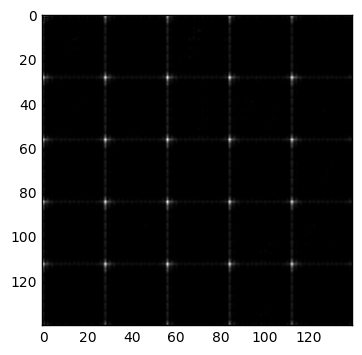

Epoch: 0 / Discriminator loss: 1.01914 / Generator loss: 2.23145
Epoch: 0 / Discriminator loss: 0.947966 / Generator loss: 1.25031
Epoch: 0 / Discriminator loss: 1.72306 / Generator loss: 0.395204
Epoch: 0 / Discriminator loss: 1.18925 / Generator loss: 1.34359
Epoch: 0 / Discriminator loss: 1.27185 / Generator loss: 1.12607
Epoch: 0 / Discriminator loss: 1.19038 / Generator loss: 1.25202
Epoch: 0 / Discriminator loss: 1.16115 / Generator loss: 1.08463
Epoch: 0 / Discriminator loss: 1.24638 / Generator loss: 1.14333
Epoch: 0 / Discriminator loss: 1.22305 / Generator loss: 0.841117
Epoch: 0 / Discriminator loss: 1.22422 / Generator loss: 1.24447


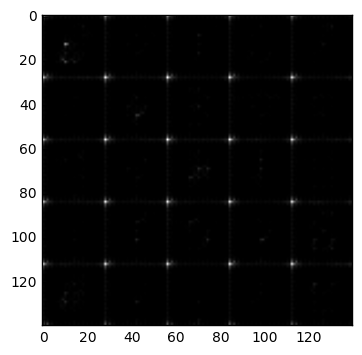

Epoch: 0 / Discriminator loss: 1.53705 / Generator loss: 1.07721
Epoch: 0 / Discriminator loss: 1.43089 / Generator loss: 0.749957
Epoch: 0 / Discriminator loss: 1.3495 / Generator loss: 0.680881
Epoch: 0 / Discriminator loss: 1.31172 / Generator loss: 1.42898
Epoch: 0 / Discriminator loss: 1.19381 / Generator loss: 0.977959
Epoch: 0 / Discriminator loss: 1.36261 / Generator loss: 1.43965
Epoch: 0 / Discriminator loss: 1.03306 / Generator loss: 1.28837
Epoch: 0 / Discriminator loss: 1.20475 / Generator loss: 0.825975
Epoch: 0 / Discriminator loss: 1.1211 / Generator loss: 1.41857
Epoch: 0 / Discriminator loss: 1.29384 / Generator loss: 0.679311


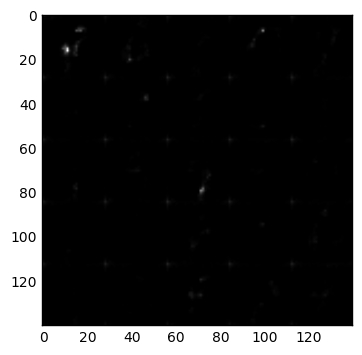

Epoch: 0 / Discriminator loss: 1.22013 / Generator loss: 0.662723
Epoch: 0 / Discriminator loss: 1.01497 / Generator loss: 1.00013
Epoch: 0 / Discriminator loss: 1.10188 / Generator loss: 1.38384
Epoch: 0 / Discriminator loss: 1.43085 / Generator loss: 1.32723
Epoch: 0 / Discriminator loss: 1.15148 / Generator loss: 0.92136
Epoch: 0 / Discriminator loss: 1.25703 / Generator loss: 0.924178
Epoch: 0 / Discriminator loss: 1.42738 / Generator loss: 1.87378
Epoch: 0 / Discriminator loss: 1.13371 / Generator loss: 1.37221
Epoch: 0 / Discriminator loss: 1.23184 / Generator loss: 0.971614
Epoch: 0 / Discriminator loss: 1.22279 / Generator loss: 1.74086


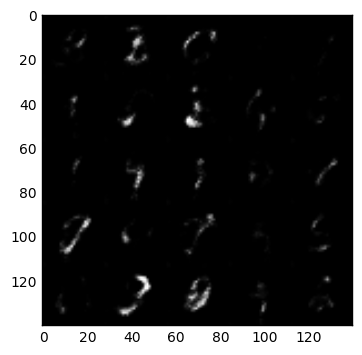

Epoch: 0 / Discriminator loss: 1.16082 / Generator loss: 1.55555
Epoch: 0 / Discriminator loss: 1.02364 / Generator loss: 1.05903
Epoch: 0 / Discriminator loss: 1.18342 / Generator loss: 1.3937
Epoch: 0 / Discriminator loss: 1.09327 / Generator loss: 1.09002
Epoch: 0 / Discriminator loss: 1.17064 / Generator loss: 1.07258
Epoch: 0 / Discriminator loss: 1.21775 / Generator loss: 1.83935
Epoch: 1 / Discriminator loss: 1.14477 / Generator loss: 1.12077
Epoch: 1 / Discriminator loss: 1.12675 / Generator loss: 0.896187
Epoch: 1 / Discriminator loss: 1.50977 / Generator loss: 0.472443
Epoch: 1 / Discriminator loss: 1.12062 / Generator loss: 1.03996


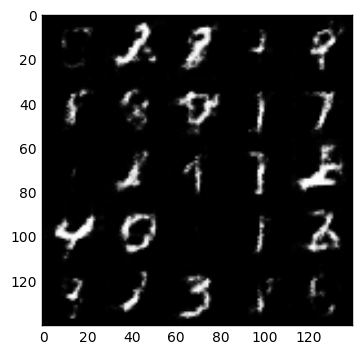

Epoch: 1 / Discriminator loss: 1.16671 / Generator loss: 0.828405
Epoch: 1 / Discriminator loss: 1.40375 / Generator loss: 0.557679
Epoch: 1 / Discriminator loss: 1.17468 / Generator loss: 0.863817
Epoch: 1 / Discriminator loss: 1.34224 / Generator loss: 0.572931
Epoch: 1 / Discriminator loss: 1.18392 / Generator loss: 1.36084
Epoch: 1 / Discriminator loss: 1.07021 / Generator loss: 1.29348
Epoch: 1 / Discriminator loss: 1.20837 / Generator loss: 1.11802
Epoch: 1 / Discriminator loss: 1.14896 / Generator loss: 1.34389
Epoch: 1 / Discriminator loss: 1.21716 / Generator loss: 0.869454
Epoch: 1 / Discriminator loss: 1.29744 / Generator loss: 0.626347


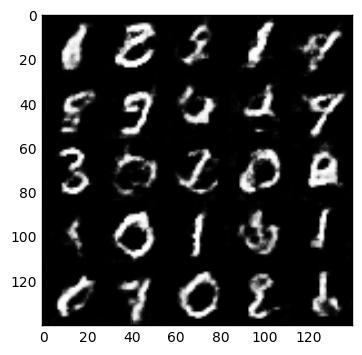

Epoch: 1 / Discriminator loss: 1.23796 / Generator loss: 0.993142
Epoch: 1 / Discriminator loss: 1.15832 / Generator loss: 0.989656
Epoch: 1 / Discriminator loss: 1.17671 / Generator loss: 1.1044
Epoch: 1 / Discriminator loss: 1.18805 / Generator loss: 0.781879
Epoch: 1 / Discriminator loss: 1.11122 / Generator loss: 0.978282
Epoch: 1 / Discriminator loss: 1.32118 / Generator loss: 0.782073
Epoch: 1 / Discriminator loss: 1.23775 / Generator loss: 1.33152
Epoch: 1 / Discriminator loss: 1.23453 / Generator loss: 0.761943
Epoch: 1 / Discriminator loss: 1.11639 / Generator loss: 1.37594
Epoch: 1 / Discriminator loss: 1.23151 / Generator loss: 0.997501


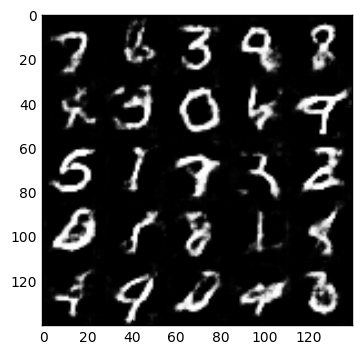

Epoch: 1 / Discriminator loss: 1.17893 / Generator loss: 0.785583
Epoch: 1 / Discriminator loss: 1.08438 / Generator loss: 1.09639
Epoch: 1 / Discriminator loss: 1.26382 / Generator loss: 1.27676
Epoch: 1 / Discriminator loss: 1.12244 / Generator loss: 1.12618
Epoch: 1 / Discriminator loss: 1.14918 / Generator loss: 0.940987
Epoch: 1 / Discriminator loss: 1.09344 / Generator loss: 1.03271
Epoch: 1 / Discriminator loss: 1.13756 / Generator loss: 0.880599
Epoch: 1 / Discriminator loss: 1.40993 / Generator loss: 0.528771
Epoch: 1 / Discriminator loss: 1.2469 / Generator loss: 0.727469
Epoch: 1 / Discriminator loss: 1.11788 / Generator loss: 1.18343


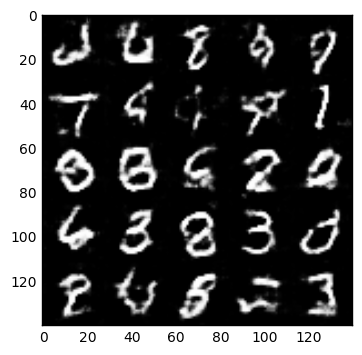

Epoch: 1 / Discriminator loss: 1.1971 / Generator loss: 0.745026
Epoch: 1 / Discriminator loss: 1.24629 / Generator loss: 1.25064
Epoch: 1 / Discriminator loss: 1.27033 / Generator loss: 0.721899
Epoch: 1 / Discriminator loss: 1.21709 / Generator loss: 1.22533
Epoch: 1 / Discriminator loss: 1.18326 / Generator loss: 0.922245
Epoch: 1 / Discriminator loss: 1.30891 / Generator loss: 0.606445
Epoch: 1 / Discriminator loss: 1.33557 / Generator loss: 0.595483
Epoch: 1 / Discriminator loss: 1.19403 / Generator loss: 1.45878
Epoch: 1 / Discriminator loss: 1.23696 / Generator loss: 1.57411
Epoch: 1 / Discriminator loss: 1.28001 / Generator loss: 1.39688


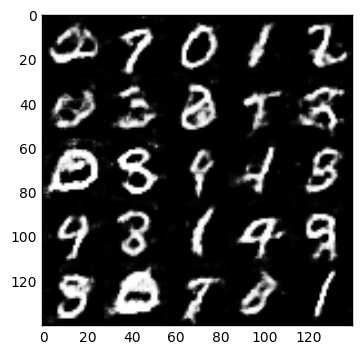

Epoch: 1 / Discriminator loss: 1.36085 / Generator loss: 0.656287
Epoch: 1 / Discriminator loss: 1.19129 / Generator loss: 1.00713
Epoch: 1 / Discriminator loss: 1.09151 / Generator loss: 0.979476


In [13]:
batch_size = 128
z_dim = 100
learning_rate = 0.0002
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch: 0 / Discriminator loss: 2.85553 / Generator loss: 0.143257
Epoch: 0 / Discriminator loss: 0.971265 / Generator loss: 1.59232
Epoch: 0 / Discriminator loss: 1.63824 / Generator loss: 0.501363
Epoch: 0 / Discriminator loss: 1.03623 / Generator loss: 0.873942
Epoch: 0 / Discriminator loss: 0.640601 / Generator loss: 2.50779
Epoch: 0 / Discriminator loss: 0.829832 / Generator loss: 5.75517
Epoch: 0 / Discriminator loss: 0.769199 / Generator loss: 6.45701
Epoch: 0 / Discriminator loss: 0.746936 / Generator loss: 2.37121
Epoch: 0 / Discriminator loss: 0.858147 / Generator loss: 2.0783
Epoch: 0 / Discriminator loss: 1.04575 / Generator loss: 1.95417


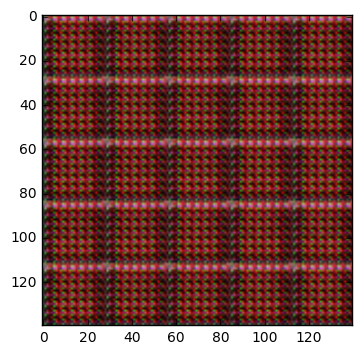

Epoch: 0 / Discriminator loss: 0.692499 / Generator loss: 1.88684
Epoch: 0 / Discriminator loss: 1.64022 / Generator loss: 0.440735
Epoch: 0 / Discriminator loss: 1.85407 / Generator loss: 0.419808
Epoch: 0 / Discriminator loss: 1.13229 / Generator loss: 1.0102
Epoch: 0 / Discriminator loss: 1.17506 / Generator loss: 1.36257
Epoch: 0 / Discriminator loss: 1.07558 / Generator loss: 1.13218
Epoch: 0 / Discriminator loss: 1.54582 / Generator loss: 0.69044
Epoch: 0 / Discriminator loss: 1.25666 / Generator loss: 0.942753
Epoch: 0 / Discriminator loss: 1.1973 / Generator loss: 1.0662
Epoch: 0 / Discriminator loss: 1.19202 / Generator loss: 1.07346


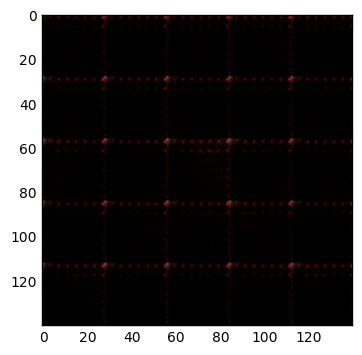

Epoch: 0 / Discriminator loss: 1.10828 / Generator loss: 1.05125
Epoch: 0 / Discriminator loss: 1.25172 / Generator loss: 0.801359
Epoch: 0 / Discriminator loss: 1.10716 / Generator loss: 1.01879
Epoch: 0 / Discriminator loss: 1.22188 / Generator loss: 0.863812
Epoch: 0 / Discriminator loss: 0.852112 / Generator loss: 1.50921
Epoch: 0 / Discriminator loss: 1.5057 / Generator loss: 0.750658
Epoch: 0 / Discriminator loss: 1.24982 / Generator loss: 1.19438
Epoch: 0 / Discriminator loss: 1.23626 / Generator loss: 0.979968
Epoch: 0 / Discriminator loss: 1.5419 / Generator loss: 0.728063
Epoch: 0 / Discriminator loss: 0.99038 / Generator loss: 1.31475


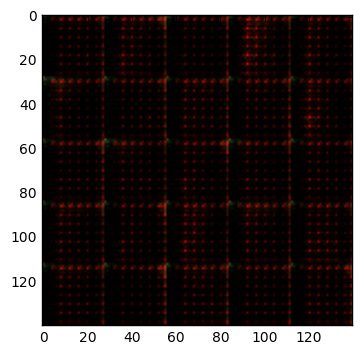

Epoch: 0 / Discriminator loss: 1.53966 / Generator loss: 0.553878
Epoch: 0 / Discriminator loss: 1.10823 / Generator loss: 1.12571
Epoch: 0 / Discriminator loss: 1.51152 / Generator loss: 0.801619
Epoch: 0 / Discriminator loss: 1.427 / Generator loss: 0.905657
Epoch: 0 / Discriminator loss: 1.58745 / Generator loss: 0.472649
Epoch: 0 / Discriminator loss: 1.48524 / Generator loss: 0.81535
Epoch: 0 / Discriminator loss: 2.12655 / Generator loss: 0.343974
Epoch: 0 / Discriminator loss: 1.51267 / Generator loss: 0.744283
Epoch: 0 / Discriminator loss: 1.36119 / Generator loss: 1.01291
Epoch: 0 / Discriminator loss: 1.30183 / Generator loss: 1.18052


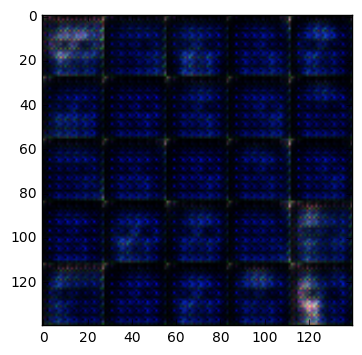

Epoch: 0 / Discriminator loss: 1.42412 / Generator loss: 0.938468
Epoch: 0 / Discriminator loss: 1.74964 / Generator loss: 0.465975
Epoch: 0 / Discriminator loss: 1.73189 / Generator loss: 0.409905
Epoch: 0 / Discriminator loss: 1.36007 / Generator loss: 0.987783
Epoch: 0 / Discriminator loss: 1.4386 / Generator loss: 0.717595
Epoch: 0 / Discriminator loss: 1.29755 / Generator loss: 0.863944
Epoch: 0 / Discriminator loss: 1.31472 / Generator loss: 0.828855
Epoch: 0 / Discriminator loss: 1.49595 / Generator loss: 0.781962
Epoch: 0 / Discriminator loss: 1.58049 / Generator loss: 0.637753
Epoch: 0 / Discriminator loss: 1.47625 / Generator loss: 0.743909


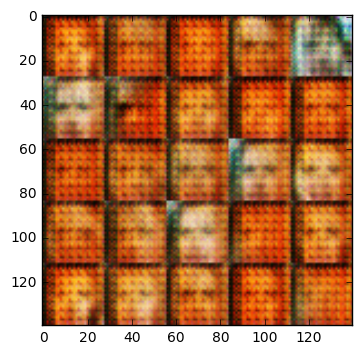

Epoch: 0 / Discriminator loss: 1.20835 / Generator loss: 1.32968
Epoch: 0 / Discriminator loss: 1.45755 / Generator loss: 0.801495
Epoch: 0 / Discriminator loss: 1.72719 / Generator loss: 0.591577
Epoch: 0 / Discriminator loss: 1.46566 / Generator loss: 0.821309
Epoch: 0 / Discriminator loss: 1.61267 / Generator loss: 0.676666
Epoch: 0 / Discriminator loss: 1.41707 / Generator loss: 0.734997
Epoch: 0 / Discriminator loss: 1.42474 / Generator loss: 0.801178
Epoch: 0 / Discriminator loss: 1.346 / Generator loss: 0.855194
Epoch: 0 / Discriminator loss: 1.55833 / Generator loss: 0.635907
Epoch: 0 / Discriminator loss: 1.40462 / Generator loss: 0.801953


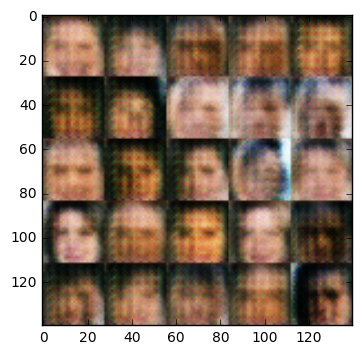

Epoch: 0 / Discriminator loss: 1.40365 / Generator loss: 0.869055
Epoch: 0 / Discriminator loss: 1.37562 / Generator loss: 0.659385
Epoch: 0 / Discriminator loss: 1.29666 / Generator loss: 0.952898
Epoch: 0 / Discriminator loss: 1.45001 / Generator loss: 0.74131
Epoch: 0 / Discriminator loss: 1.52947 / Generator loss: 0.794326
Epoch: 0 / Discriminator loss: 1.38609 / Generator loss: 0.763267
Epoch: 0 / Discriminator loss: 1.40427 / Generator loss: 0.766367
Epoch: 0 / Discriminator loss: 1.69465 / Generator loss: 0.5089
Epoch: 0 / Discriminator loss: 1.43235 / Generator loss: 0.768275
Epoch: 0 / Discriminator loss: 1.24688 / Generator loss: 0.864866


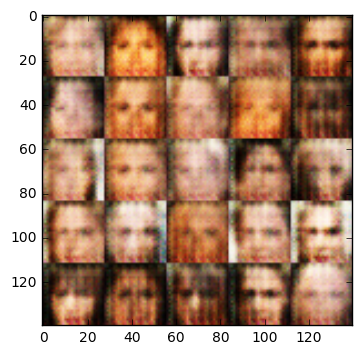

Epoch: 0 / Discriminator loss: 1.45439 / Generator loss: 0.778486
Epoch: 0 / Discriminator loss: 1.38701 / Generator loss: 0.816853
Epoch: 0 / Discriminator loss: 1.41533 / Generator loss: 0.694578
Epoch: 0 / Discriminator loss: 1.47112 / Generator loss: 0.665739
Epoch: 0 / Discriminator loss: 1.34065 / Generator loss: 1.02204
Epoch: 0 / Discriminator loss: 1.45667 / Generator loss: 0.727291
Epoch: 0 / Discriminator loss: 1.44513 / Generator loss: 0.725516
Epoch: 0 / Discriminator loss: 1.33647 / Generator loss: 0.801941
Epoch: 0 / Discriminator loss: 1.49535 / Generator loss: 0.791974
Epoch: 0 / Discriminator loss: 1.29628 / Generator loss: 0.988962


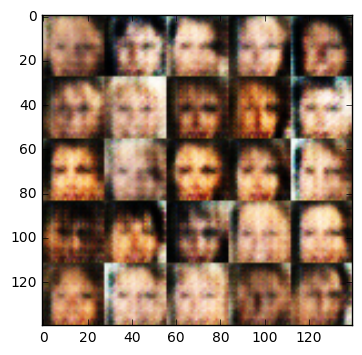

Epoch: 0 / Discriminator loss: 1.42726 / Generator loss: 0.87729
Epoch: 0 / Discriminator loss: 1.61065 / Generator loss: 0.679471
Epoch: 0 / Discriminator loss: 1.46848 / Generator loss: 0.702972
Epoch: 0 / Discriminator loss: 1.41842 / Generator loss: 0.778328
Epoch: 0 / Discriminator loss: 1.45908 / Generator loss: 0.796506
Epoch: 0 / Discriminator loss: 1.50683 / Generator loss: 0.806009
Epoch: 0 / Discriminator loss: 1.39197 / Generator loss: 0.721296
Epoch: 0 / Discriminator loss: 1.68116 / Generator loss: 0.604225
Epoch: 0 / Discriminator loss: 1.54975 / Generator loss: 0.731901
Epoch: 0 / Discriminator loss: 1.54254 / Generator loss: 0.60626


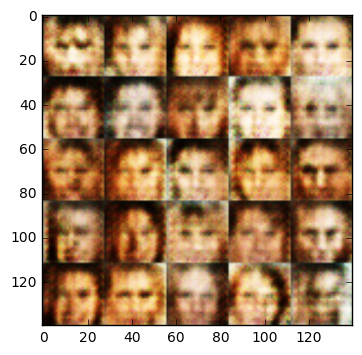

Epoch: 0 / Discriminator loss: 1.55665 / Generator loss: 0.78722
Epoch: 0 / Discriminator loss: 1.42432 / Generator loss: 0.755281
Epoch: 0 / Discriminator loss: 1.5283 / Generator loss: 0.741545
Epoch: 0 / Discriminator loss: 1.62832 / Generator loss: 0.615459
Epoch: 0 / Discriminator loss: 1.55522 / Generator loss: 0.699708
Epoch: 0 / Discriminator loss: 1.49703 / Generator loss: 0.720496
Epoch: 0 / Discriminator loss: 1.2932 / Generator loss: 0.804488
Epoch: 0 / Discriminator loss: 1.48096 / Generator loss: 0.825312
Epoch: 0 / Discriminator loss: 1.19074 / Generator loss: 0.922936
Epoch: 0 / Discriminator loss: 1.48615 / Generator loss: 0.683852


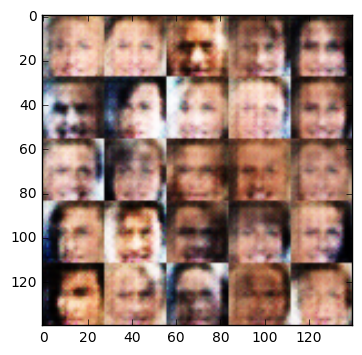

Epoch: 0 / Discriminator loss: 1.44488 / Generator loss: 0.659633
Epoch: 0 / Discriminator loss: 1.44978 / Generator loss: 0.709226
Epoch: 0 / Discriminator loss: 1.40277 / Generator loss: 0.737453
Epoch: 0 / Discriminator loss: 1.42322 / Generator loss: 0.687064
Epoch: 0 / Discriminator loss: 1.43607 / Generator loss: 0.753679
Epoch: 0 / Discriminator loss: 1.27853 / Generator loss: 0.882449
Epoch: 0 / Discriminator loss: 1.4056 / Generator loss: 0.796089
Epoch: 0 / Discriminator loss: 1.46374 / Generator loss: 0.701639
Epoch: 0 / Discriminator loss: 1.53372 / Generator loss: 0.700575
Epoch: 0 / Discriminator loss: 1.41889 / Generator loss: 0.698726


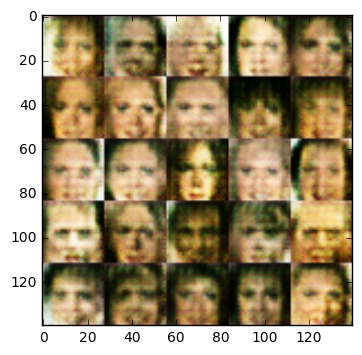

Epoch: 0 / Discriminator loss: 1.3526 / Generator loss: 0.904596
Epoch: 0 / Discriminator loss: 1.3753 / Generator loss: 0.861325
Epoch: 0 / Discriminator loss: 1.17488 / Generator loss: 1.10009
Epoch: 0 / Discriminator loss: 1.42215 / Generator loss: 0.586185
Epoch: 0 / Discriminator loss: 1.22574 / Generator loss: 1.1033
Epoch: 0 / Discriminator loss: 1.31856 / Generator loss: 0.7067
Epoch: 0 / Discriminator loss: 1.29891 / Generator loss: 0.705093
Epoch: 0 / Discriminator loss: 1.17598 / Generator loss: 0.757381
Epoch: 0 / Discriminator loss: 1.7381 / Generator loss: 0.378719
Epoch: 0 / Discriminator loss: 1.34436 / Generator loss: 0.627375


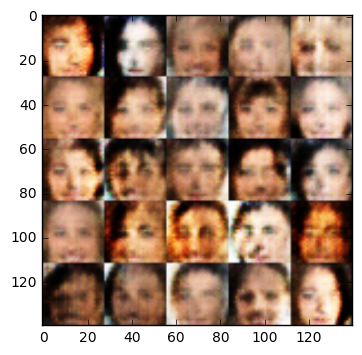

Epoch: 0 / Discriminator loss: 1.54231 / Generator loss: 1.95861
Epoch: 0 / Discriminator loss: 1.30625 / Generator loss: 1.04347
Epoch: 0 / Discriminator loss: 1.06061 / Generator loss: 0.947195
Epoch: 0 / Discriminator loss: 1.13794 / Generator loss: 1.92559
Epoch: 0 / Discriminator loss: 1.33402 / Generator loss: 0.627843
Epoch: 0 / Discriminator loss: 1.29106 / Generator loss: 0.71831
Epoch: 0 / Discriminator loss: 1.07243 / Generator loss: 1.78753
Epoch: 0 / Discriminator loss: 1.29565 / Generator loss: 0.866261
Epoch: 0 / Discriminator loss: 1.58253 / Generator loss: 0.808203
Epoch: 0 / Discriminator loss: 1.36521 / Generator loss: 0.829568


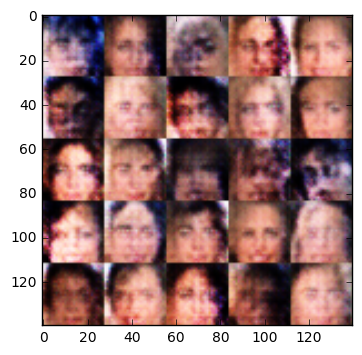

Epoch: 0 / Discriminator loss: 1.81562 / Generator loss: 0.687775
Epoch: 0 / Discriminator loss: 1.57265 / Generator loss: 0.576913
Epoch: 0 / Discriminator loss: 1.69607 / Generator loss: 0.575737
Epoch: 0 / Discriminator loss: 1.57799 / Generator loss: 0.695541
Epoch: 0 / Discriminator loss: 1.62565 / Generator loss: 0.646714
Epoch: 0 / Discriminator loss: 1.3876 / Generator loss: 0.775203
Epoch: 0 / Discriminator loss: 1.33706 / Generator loss: 0.854624
Epoch: 0 / Discriminator loss: 0.981357 / Generator loss: 1.20669
Epoch: 0 / Discriminator loss: 1.4432 / Generator loss: 0.808323
Epoch: 0 / Discriminator loss: 1.03093 / Generator loss: 0.976779


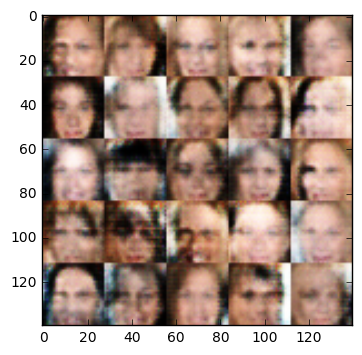

Epoch: 0 / Discriminator loss: 1.34649 / Generator loss: 0.565056
Epoch: 0 / Discriminator loss: 1.31632 / Generator loss: 0.846327
Epoch: 0 / Discriminator loss: 1.02598 / Generator loss: 0.817793
Epoch: 0 / Discriminator loss: 1.42685 / Generator loss: 0.518444
Epoch: 0 / Discriminator loss: 1.17177 / Generator loss: 0.999693
Epoch: 0 / Discriminator loss: 1.21516 / Generator loss: 0.68663
Epoch: 0 / Discriminator loss: 1.49437 / Generator loss: 4.09888
Epoch: 0 / Discriminator loss: 0.863663 / Generator loss: 1.21932
Epoch: 0 / Discriminator loss: 1.47179 / Generator loss: 0.492254
Epoch: 0 / Discriminator loss: 1.0914 / Generator loss: 0.942094


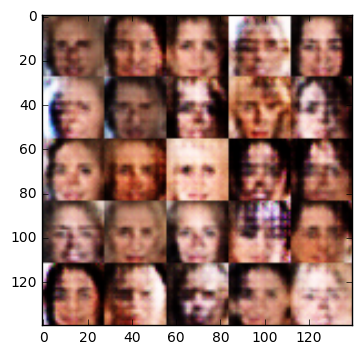

Epoch: 0 / Discriminator loss: 1.20251 / Generator loss: 0.899511
Epoch: 0 / Discriminator loss: 1.02404 / Generator loss: 1.22064
Epoch: 0 / Discriminator loss: 1.03335 / Generator loss: 1.39224
Epoch: 0 / Discriminator loss: 1.22662 / Generator loss: 0.919004
Epoch: 0 / Discriminator loss: 1.73273 / Generator loss: 0.396458
Epoch: 0 / Discriminator loss: 0.907747 / Generator loss: 1.31361
Epoch: 0 / Discriminator loss: 1.45168 / Generator loss: 1.45859
Epoch: 0 / Discriminator loss: 1.24229 / Generator loss: 1.11883
Epoch: 0 / Discriminator loss: 1.35121 / Generator loss: 1.30378
Epoch: 0 / Discriminator loss: 0.706725 / Generator loss: 1.66199


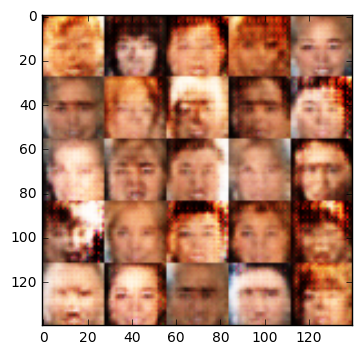

Epoch: 0 / Discriminator loss: 1.10591 / Generator loss: 1.10534
Epoch: 0 / Discriminator loss: 1.00233 / Generator loss: 1.28978
Epoch: 0 / Discriminator loss: 1.32721 / Generator loss: 1.15813
Epoch: 0 / Discriminator loss: 1.64154 / Generator loss: 0.413156
Epoch: 0 / Discriminator loss: 2.08727 / Generator loss: 0.21696
Epoch: 0 / Discriminator loss: 0.876053 / Generator loss: 1.47505
Epoch: 0 / Discriminator loss: 1.3487 / Generator loss: 0.752003
Epoch: 0 / Discriminator loss: 1.00051 / Generator loss: 1.04926
Epoch: 0 / Discriminator loss: 1.33422 / Generator loss: 1.1086
Epoch: 0 / Discriminator loss: 1.38242 / Generator loss: 1.05108


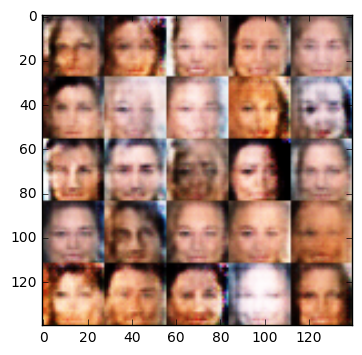

Epoch: 0 / Discriminator loss: 1.13231 / Generator loss: 1.04639
Epoch: 0 / Discriminator loss: 1.76634 / Generator loss: 0.306167
Epoch: 0 / Discriminator loss: 1.00277 / Generator loss: 1.42691
Epoch: 0 / Discriminator loss: 1.1848 / Generator loss: 0.820308
Epoch: 0 / Discriminator loss: 1.46516 / Generator loss: 0.514644
Epoch: 0 / Discriminator loss: 1.71255 / Generator loss: 0.507382
Epoch: 0 / Discriminator loss: 0.948686 / Generator loss: 0.969011
Epoch: 0 / Discriminator loss: 1.507 / Generator loss: 0.596807
Epoch: 0 / Discriminator loss: 1.17813 / Generator loss: 1.04745
Epoch: 0 / Discriminator loss: 1.49353 / Generator loss: 1.08607


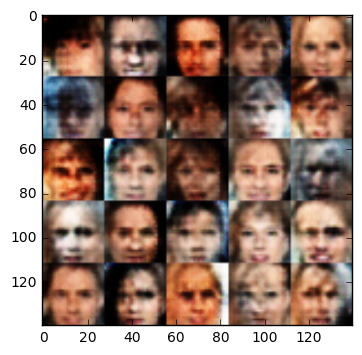

Epoch: 0 / Discriminator loss: 0.995685 / Generator loss: 1.45459
Epoch: 0 / Discriminator loss: 0.824852 / Generator loss: 1.15465
Epoch: 0 / Discriminator loss: 1.3052 / Generator loss: 1.23642
Epoch: 0 / Discriminator loss: 0.938244 / Generator loss: 1.11932
Epoch: 0 / Discriminator loss: 1.3018 / Generator loss: 1.07163
Epoch: 0 / Discriminator loss: 1.29876 / Generator loss: 1.77862
Epoch: 0 / Discriminator loss: 1.27776 / Generator loss: 0.713317
Epoch: 0 / Discriminator loss: 1.26454 / Generator loss: 0.699521
Epoch: 0 / Discriminator loss: 1.41349 / Generator loss: 0.514584
Epoch: 0 / Discriminator loss: 1.0905 / Generator loss: 0.978303


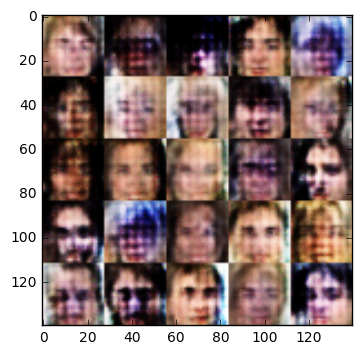

Epoch: 0 / Discriminator loss: 1.34649 / Generator loss: 0.552043
Epoch: 0 / Discriminator loss: 1.05894 / Generator loss: 1.00962
Epoch: 0 / Discriminator loss: 1.52021 / Generator loss: 0.523654
Epoch: 0 / Discriminator loss: 0.877712 / Generator loss: 1.23454
Epoch: 0 / Discriminator loss: 0.744751 / Generator loss: 1.60801
Epoch: 0 / Discriminator loss: 1.23283 / Generator loss: 0.839549
Epoch: 0 / Discriminator loss: 1.37426 / Generator loss: 0.826907
Epoch: 0 / Discriminator loss: 1.14217 / Generator loss: 0.93533
Epoch: 0 / Discriminator loss: 0.956414 / Generator loss: 1.41086
Epoch: 0 / Discriminator loss: 0.855253 / Generator loss: 1.25634


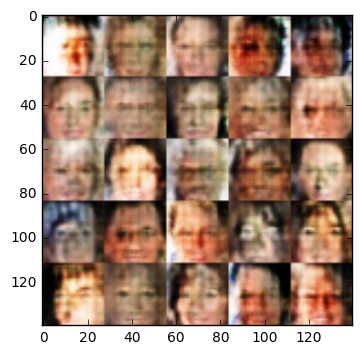

Epoch: 0 / Discriminator loss: 1.36726 / Generator loss: 0.728215
Epoch: 0 / Discriminator loss: 1.41917 / Generator loss: 0.599736
Epoch: 0 / Discriminator loss: 1.10869 / Generator loss: 0.885649
Epoch: 0 / Discriminator loss: 1.42254 / Generator loss: 0.832041
Epoch: 0 / Discriminator loss: 0.620517 / Generator loss: 3.42084
Epoch: 0 / Discriminator loss: 1.26641 / Generator loss: 1.05036
Epoch: 0 / Discriminator loss: 1.34526 / Generator loss: 0.656706
Epoch: 0 / Discriminator loss: 1.28595 / Generator loss: 0.997283
Epoch: 0 / Discriminator loss: 1.90857 / Generator loss: 0.319157
Epoch: 0 / Discriminator loss: 1.28292 / Generator loss: 0.672274


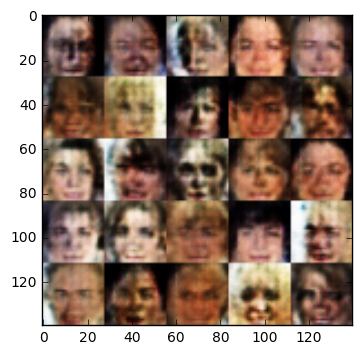

Epoch: 0 / Discriminator loss: 1.15581 / Generator loss: 1.41808
Epoch: 0 / Discriminator loss: 1.21728 / Generator loss: 1.02922
Epoch: 0 / Discriminator loss: 0.878018 / Generator loss: 1.3679
Epoch: 0 / Discriminator loss: 1.32091 / Generator loss: 0.659235
Epoch: 0 / Discriminator loss: 1.28552 / Generator loss: 0.763413
Epoch: 0 / Discriminator loss: 1.30459 / Generator loss: 1.02085
Epoch: 0 / Discriminator loss: 1.13411 / Generator loss: 1.09539
Epoch: 0 / Discriminator loss: 1.37207 / Generator loss: 0.805623
Epoch: 0 / Discriminator loss: 0.962382 / Generator loss: 2.53261
Epoch: 0 / Discriminator loss: 1.45977 / Generator loss: 0.728032


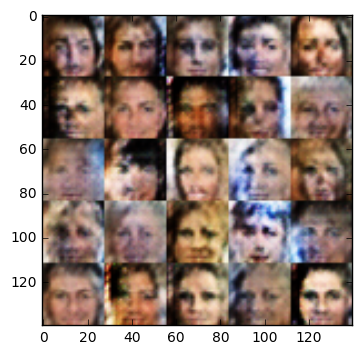

Epoch: 0 / Discriminator loss: 0.946846 / Generator loss: 1.44852
Epoch: 0 / Discriminator loss: 1.01813 / Generator loss: 1.05824
Epoch: 0 / Discriminator loss: 0.876271 / Generator loss: 2.10205
Epoch: 0 / Discriminator loss: 1.56819 / Generator loss: 0.796717
Epoch: 0 / Discriminator loss: 1.60267 / Generator loss: 0.528467
Epoch: 0 / Discriminator loss: 0.829473 / Generator loss: 1.248
Epoch: 0 / Discriminator loss: 1.40779 / Generator loss: 0.908762
Epoch: 0 / Discriminator loss: 1.59949 / Generator loss: 0.438747
Epoch: 0 / Discriminator loss: 1.14452 / Generator loss: 0.857979
Epoch: 0 / Discriminator loss: 1.43666 / Generator loss: 1.4439


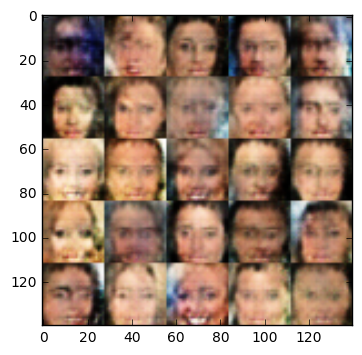

Epoch: 0 / Discriminator loss: 0.780024 / Generator loss: 2.80764
Epoch: 0 / Discriminator loss: 1.1842 / Generator loss: 0.930971
Epoch: 0 / Discriminator loss: 1.36955 / Generator loss: 1.5976
Epoch: 0 / Discriminator loss: 1.11276 / Generator loss: 0.923922
Epoch: 0 / Discriminator loss: 1.04686 / Generator loss: 1.30077
Epoch: 0 / Discriminator loss: 1.42365 / Generator loss: 0.601462
Epoch: 0 / Discriminator loss: 1.28166 / Generator loss: 0.984312
Epoch: 0 / Discriminator loss: 1.35569 / Generator loss: 1.08505
Epoch: 0 / Discriminator loss: 1.28821 / Generator loss: 0.70875
Epoch: 0 / Discriminator loss: 0.832803 / Generator loss: 1.69563


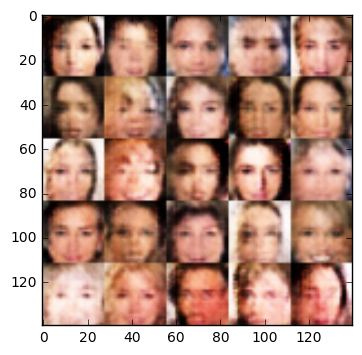

Epoch: 0 / Discriminator loss: 1.16666 / Generator loss: 0.865602
Epoch: 0 / Discriminator loss: 1.58907 / Generator loss: 0.39786
Epoch: 0 / Discriminator loss: 1.67827 / Generator loss: 0.372373
Epoch: 0 / Discriminator loss: 1.64926 / Generator loss: 0.473708
Epoch: 0 / Discriminator loss: 1.14046 / Generator loss: 1.65132
Epoch: 0 / Discriminator loss: 0.961574 / Generator loss: 1.04793
Epoch: 0 / Discriminator loss: 0.699174 / Generator loss: 1.80159
Epoch: 0 / Discriminator loss: 1.1699 / Generator loss: 1.17948
Epoch: 0 / Discriminator loss: 1.77273 / Generator loss: 0.309822
Epoch: 0 / Discriminator loss: 1.68292 / Generator loss: 0.702268


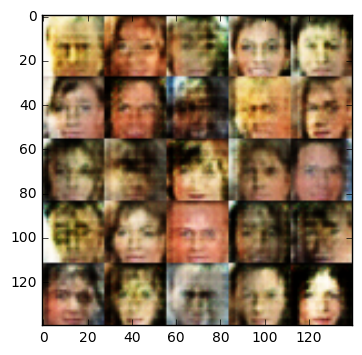

Epoch: 0 / Discriminator loss: 1.35306 / Generator loss: 0.667473
Epoch: 0 / Discriminator loss: 1.44618 / Generator loss: 0.819794
Epoch: 0 / Discriminator loss: 1.15252 / Generator loss: 1.51473
Epoch: 0 / Discriminator loss: 1.31718 / Generator loss: 0.662546
Epoch: 0 / Discriminator loss: 1.18869 / Generator loss: 1.05163
Epoch: 0 / Discriminator loss: 1.10636 / Generator loss: 1.08157
Epoch: 0 / Discriminator loss: 1.18817 / Generator loss: 0.943189
Epoch: 0 / Discriminator loss: 1.56266 / Generator loss: 0.438475
Epoch: 0 / Discriminator loss: 1.29035 / Generator loss: 0.810251
Epoch: 0 / Discriminator loss: 1.29727 / Generator loss: 0.844843


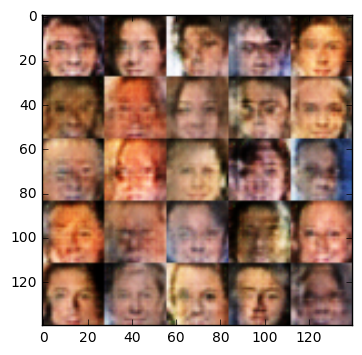

Epoch: 0 / Discriminator loss: 1.58372 / Generator loss: 0.49403
Epoch: 0 / Discriminator loss: 1.67515 / Generator loss: 0.562857
Epoch: 0 / Discriminator loss: 1.29202 / Generator loss: 0.861942
Epoch: 0 / Discriminator loss: 1.48271 / Generator loss: 0.588122
Epoch: 0 / Discriminator loss: 1.28077 / Generator loss: 0.702893
Epoch: 0 / Discriminator loss: 1.33692 / Generator loss: 0.876536
Epoch: 0 / Discriminator loss: 1.67555 / Generator loss: 0.757494
Epoch: 0 / Discriminator loss: 1.361 / Generator loss: 0.645572
Epoch: 0 / Discriminator loss: 1.44481 / Generator loss: 0.759043
Epoch: 0 / Discriminator loss: 1.28729 / Generator loss: 1.09618


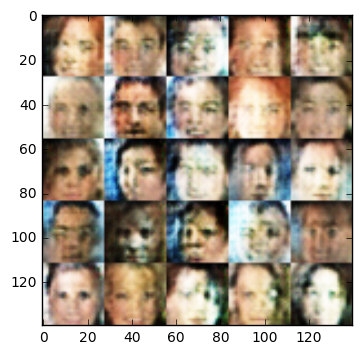

Epoch: 0 / Discriminator loss: 1.40835 / Generator loss: 0.715073
Epoch: 0 / Discriminator loss: 1.01449 / Generator loss: 1.61646
Epoch: 0 / Discriminator loss: 1.42258 / Generator loss: 0.741957
Epoch: 0 / Discriminator loss: 1.3999 / Generator loss: 0.675761
Epoch: 0 / Discriminator loss: 1.2425 / Generator loss: 0.957149
Epoch: 0 / Discriminator loss: 1.56393 / Generator loss: 0.61119
Epoch: 0 / Discriminator loss: 1.44423 / Generator loss: 0.712968
Epoch: 0 / Discriminator loss: 1.01698 / Generator loss: 1.32457
Epoch: 0 / Discriminator loss: 1.29338 / Generator loss: 0.736081
Epoch: 0 / Discriminator loss: 1.34671 / Generator loss: 0.895872


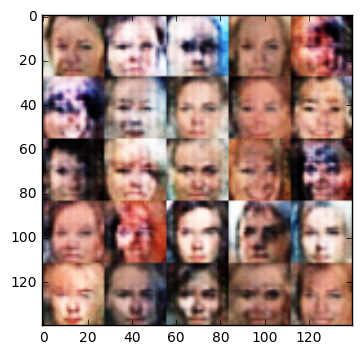

Epoch: 0 / Discriminator loss: 1.18967 / Generator loss: 0.996773
Epoch: 0 / Discriminator loss: 1.50527 / Generator loss: 0.69154
Epoch: 0 / Discriminator loss: 1.4843 / Generator loss: 0.586334
Epoch: 0 / Discriminator loss: 1.43177 / Generator loss: 0.642841
Epoch: 0 / Discriminator loss: 1.52173 / Generator loss: 0.63761
Epoch: 0 / Discriminator loss: 1.41115 / Generator loss: 0.776736
Epoch: 0 / Discriminator loss: 1.16587 / Generator loss: 0.998405
Epoch: 0 / Discriminator loss: 1.48232 / Generator loss: 0.682744
Epoch: 0 / Discriminator loss: 1.32733 / Generator loss: 0.801618
Epoch: 0 / Discriminator loss: 1.16658 / Generator loss: 0.915826


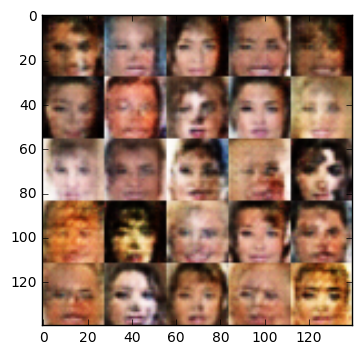

Epoch: 0 / Discriminator loss: 1.51408 / Generator loss: 0.544559
Epoch: 0 / Discriminator loss: 1.37357 / Generator loss: 0.753251
Epoch: 0 / Discriminator loss: 1.29921 / Generator loss: 0.801893
Epoch: 0 / Discriminator loss: 1.58262 / Generator loss: 0.783013
Epoch: 0 / Discriminator loss: 1.0279 / Generator loss: 1.10145
Epoch: 0 / Discriminator loss: 1.23821 / Generator loss: 1.00862
Epoch: 0 / Discriminator loss: 1.42216 / Generator loss: 0.661407
Epoch: 0 / Discriminator loss: 1.20412 / Generator loss: 0.739112
Epoch: 0 / Discriminator loss: 1.16823 / Generator loss: 0.956594
Epoch: 0 / Discriminator loss: 1.44036 / Generator loss: 0.667372


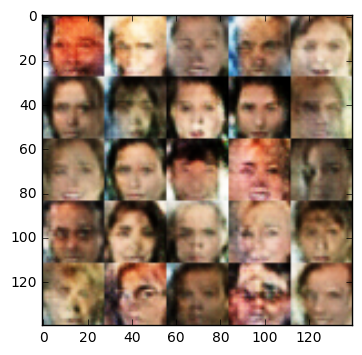

Epoch: 0 / Discriminator loss: 1.42166 / Generator loss: 0.806756
Epoch: 0 / Discriminator loss: 1.2901 / Generator loss: 0.88453
Epoch: 0 / Discriminator loss: 1.46183 / Generator loss: 0.745078
Epoch: 0 / Discriminator loss: 0.978449 / Generator loss: 1.14075
Epoch: 0 / Discriminator loss: 1.14616 / Generator loss: 0.938593
Epoch: 0 / Discriminator loss: 1.55898 / Generator loss: 0.589466
Epoch: 0 / Discriminator loss: 1.35933 / Generator loss: 0.783609
Epoch: 0 / Discriminator loss: 1.18898 / Generator loss: 0.872051
Epoch: 0 / Discriminator loss: 1.63551 / Generator loss: 0.572302
Epoch: 0 / Discriminator loss: 1.35818 / Generator loss: 0.870098


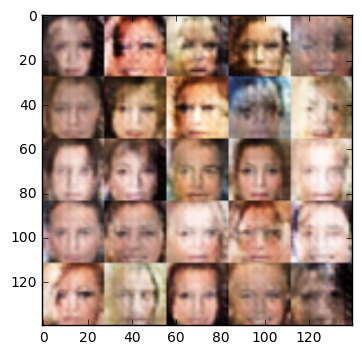

Epoch: 0 / Discriminator loss: 1.3013 / Generator loss: 0.810567
Epoch: 0 / Discriminator loss: 1.21242 / Generator loss: 0.799808
Epoch: 0 / Discriminator loss: 1.27924 / Generator loss: 1.11745
Epoch: 0 / Discriminator loss: 1.66759 / Generator loss: 0.550389
Epoch: 0 / Discriminator loss: 1.42023 / Generator loss: 0.803783
Epoch: 0 / Discriminator loss: 1.37067 / Generator loss: 0.65931
Epoch: 0 / Discriminator loss: 1.24966 / Generator loss: 0.844437
Epoch: 0 / Discriminator loss: 1.20548 / Generator loss: 0.875066
Epoch: 0 / Discriminator loss: 1.47491 / Generator loss: 0.539459
Epoch: 0 / Discriminator loss: 1.43361 / Generator loss: 0.612734


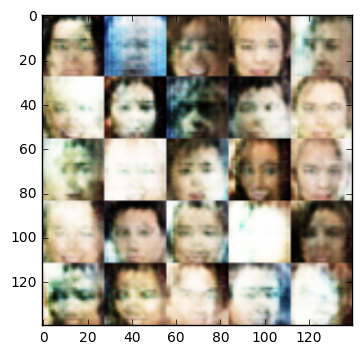

Epoch: 0 / Discriminator loss: 1.35001 / Generator loss: 0.73217
Epoch: 0 / Discriminator loss: 1.49183 / Generator loss: 0.693868
Epoch: 0 / Discriminator loss: 1.0284 / Generator loss: 1.09513
Epoch: 0 / Discriminator loss: 1.33803 / Generator loss: 0.822501
Epoch: 0 / Discriminator loss: 1.18907 / Generator loss: 1.02577
Epoch: 0 / Discriminator loss: 1.42788 / Generator loss: 0.692551
Epoch: 0 / Discriminator loss: 1.49736 / Generator loss: 0.569815
Epoch: 0 / Discriminator loss: 0.93281 / Generator loss: 1.21765
Epoch: 0 / Discriminator loss: 1.57076 / Generator loss: 1.10542
Epoch: 0 / Discriminator loss: 1.39414 / Generator loss: 0.815164


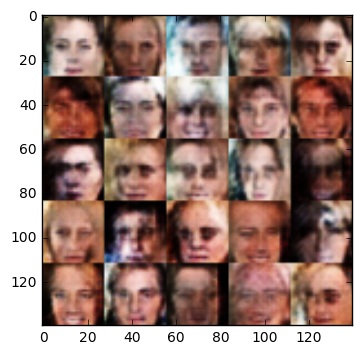

Epoch: 0 / Discriminator loss: 1.33041 / Generator loss: 0.773078
Epoch: 0 / Discriminator loss: 1.35199 / Generator loss: 0.829756
Epoch: 0 / Discriminator loss: 1.48234 / Generator loss: 0.668873
Epoch: 0 / Discriminator loss: 1.17564 / Generator loss: 0.889072
Epoch: 0 / Discriminator loss: 1.29003 / Generator loss: 0.729387
Epoch: 0 / Discriminator loss: 1.22799 / Generator loss: 0.77474
Epoch: 0 / Discriminator loss: 1.24313 / Generator loss: 0.692759
Epoch: 0 / Discriminator loss: 1.46124 / Generator loss: 0.936182
Epoch: 0 / Discriminator loss: 1.23547 / Generator loss: 0.70398
Epoch: 0 / Discriminator loss: 1.40317 / Generator loss: 0.864628


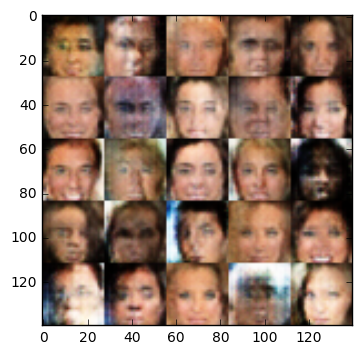

Epoch: 0 / Discriminator loss: 1.16777 / Generator loss: 0.908281
Epoch: 0 / Discriminator loss: 1.04463 / Generator loss: 0.968479
Epoch: 0 / Discriminator loss: 1.19405 / Generator loss: 0.784869
Epoch: 0 / Discriminator loss: 1.22589 / Generator loss: 1.10802
Epoch: 0 / Discriminator loss: 1.53287 / Generator loss: 0.639522
Epoch: 0 / Discriminator loss: 1.01122 / Generator loss: 1.3414
Epoch: 0 / Discriminator loss: 1.09345 / Generator loss: 1.00883
Epoch: 0 / Discriminator loss: 1.14174 / Generator loss: 0.871283
Epoch: 0 / Discriminator loss: 1.46468 / Generator loss: 0.702035
Epoch: 0 / Discriminator loss: 1.12002 / Generator loss: 0.843632


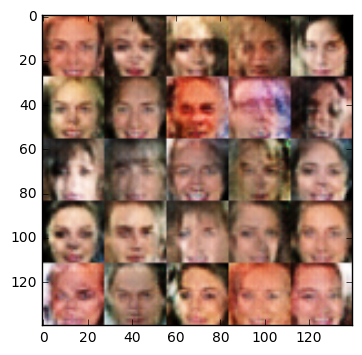

Epoch: 0 / Discriminator loss: 1.23021 / Generator loss: 0.837289
Epoch: 0 / Discriminator loss: 1.34606 / Generator loss: 0.961448
Epoch: 0 / Discriminator loss: 1.71922 / Generator loss: 0.32354
Epoch: 0 / Discriminator loss: 1.39272 / Generator loss: 0.688155
Epoch: 0 / Discriminator loss: 0.923674 / Generator loss: 1.35501
Epoch: 0 / Discriminator loss: 1.27237 / Generator loss: 0.727267
Epoch: 0 / Discriminator loss: 1.61511 / Generator loss: 0.690401
Epoch: 0 / Discriminator loss: 1.53988 / Generator loss: 0.676924
Epoch: 0 / Discriminator loss: 1.23355 / Generator loss: 0.906255
Epoch: 0 / Discriminator loss: 1.38686 / Generator loss: 0.647373


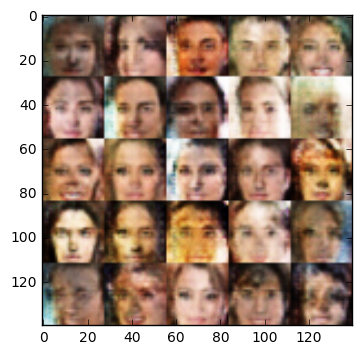

Epoch: 0 / Discriminator loss: 1.36942 / Generator loss: 0.632185
Epoch: 0 / Discriminator loss: 1.32506 / Generator loss: 0.718991
Epoch: 0 / Discriminator loss: 1.04576 / Generator loss: 1.25902
Epoch: 0 / Discriminator loss: 1.28927 / Generator loss: 0.674872
Epoch: 0 / Discriminator loss: 1.28734 / Generator loss: 0.849096
Epoch: 0 / Discriminator loss: 1.22121 / Generator loss: 1.04155
Epoch: 0 / Discriminator loss: 1.33178 / Generator loss: 0.767678
Epoch: 0 / Discriminator loss: 1.08358 / Generator loss: 0.987469
Epoch: 0 / Discriminator loss: 2.18671 / Generator loss: 0.18938
Epoch: 0 / Discriminator loss: 1.28132 / Generator loss: 0.928117


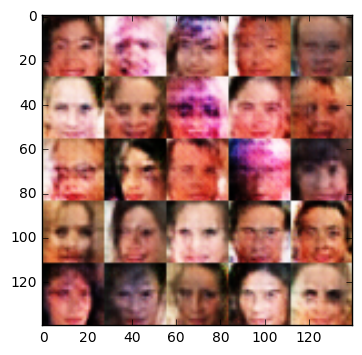

Epoch: 0 / Discriminator loss: 1.66106 / Generator loss: 0.390552
Epoch: 0 / Discriminator loss: 1.31194 / Generator loss: 0.826539
Epoch: 0 / Discriminator loss: 1.39636 / Generator loss: 1.10509
Epoch: 0 / Discriminator loss: 1.16605 / Generator loss: 0.851252
Epoch: 0 / Discriminator loss: 1.34175 / Generator loss: 0.856496
Epoch: 0 / Discriminator loss: 1.1341 / Generator loss: 0.928116
Epoch: 0 / Discriminator loss: 1.06845 / Generator loss: 1.0984
Epoch: 0 / Discriminator loss: 1.48368 / Generator loss: 0.611681
Epoch: 0 / Discriminator loss: 1.09605 / Generator loss: 0.860124
Epoch: 0 / Discriminator loss: 1.30406 / Generator loss: 0.879732


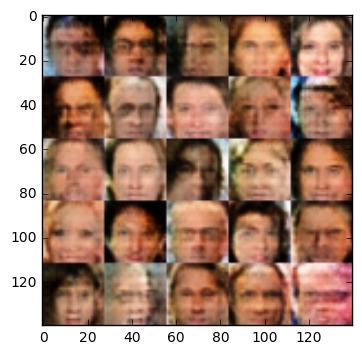

Epoch: 0 / Discriminator loss: 1.28367 / Generator loss: 3.93672
Epoch: 0 / Discriminator loss: 1.04354 / Generator loss: 0.859407
Epoch: 0 / Discriminator loss: 1.06683 / Generator loss: 1.20609
Epoch: 0 / Discriminator loss: 1.28741 / Generator loss: 0.794972
Epoch: 0 / Discriminator loss: 1.2111 / Generator loss: 0.757159
Epoch: 0 / Discriminator loss: 1.42833 / Generator loss: 0.628894
Epoch: 0 / Discriminator loss: 1.37327 / Generator loss: 0.854308
Epoch: 0 / Discriminator loss: 0.86113 / Generator loss: 1.39488
Epoch: 0 / Discriminator loss: 1.23255 / Generator loss: 0.924953
Epoch: 0 / Discriminator loss: 1.49988 / Generator loss: 0.703495


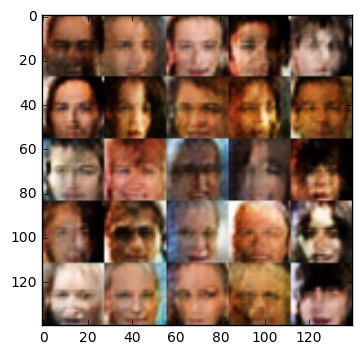

Epoch: 0 / Discriminator loss: 1.46058 / Generator loss: 0.577688
Epoch: 0 / Discriminator loss: 1.30487 / Generator loss: 0.842411
Epoch: 0 / Discriminator loss: 1.1916 / Generator loss: 0.91064
Epoch: 0 / Discriminator loss: 1.50555 / Generator loss: 0.712482
Epoch: 0 / Discriminator loss: 1.41384 / Generator loss: 0.731556
Epoch: 0 / Discriminator loss: 1.14361 / Generator loss: 1.15206
Epoch: 0 / Discriminator loss: 0.887937 / Generator loss: 1.19084
Epoch: 0 / Discriminator loss: 1.45619 / Generator loss: 0.682074
Epoch: 0 / Discriminator loss: 1.47397 / Generator loss: 0.675896
Epoch: 0 / Discriminator loss: 0.928618 / Generator loss: 1.0697


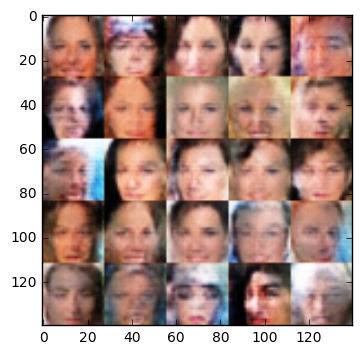

Epoch: 0 / Discriminator loss: 1.17747 / Generator loss: 0.91787
Epoch: 0 / Discriminator loss: 1.07893 / Generator loss: 1.03095
Epoch: 0 / Discriminator loss: 1.1386 / Generator loss: 0.744857
Epoch: 0 / Discriminator loss: 1.15163 / Generator loss: 1.1071
Epoch: 0 / Discriminator loss: 1.385 / Generator loss: 0.942446
Epoch: 0 / Discriminator loss: 1.52184 / Generator loss: 0.759597
Epoch: 0 / Discriminator loss: 1.40382 / Generator loss: 0.770199
Epoch: 0 / Discriminator loss: 1.21475 / Generator loss: 0.846464
Epoch: 0 / Discriminator loss: 1.4006 / Generator loss: 0.764604
Epoch: 0 / Discriminator loss: 1.34996 / Generator loss: 0.878095


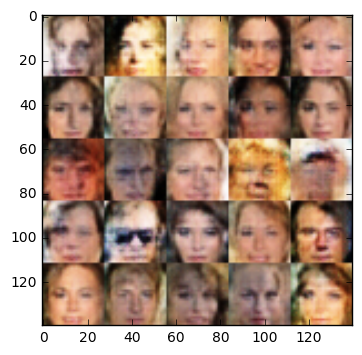

Epoch: 0 / Discriminator loss: 1.14835 / Generator loss: 0.989212
Epoch: 0 / Discriminator loss: 1.32878 / Generator loss: 0.60704
Epoch: 0 / Discriminator loss: 0.914863 / Generator loss: 1.18196
Epoch: 0 / Discriminator loss: 1.22051 / Generator loss: 0.780169
Epoch: 0 / Discriminator loss: 1.23787 / Generator loss: 0.731661
Epoch: 0 / Discriminator loss: 0.902873 / Generator loss: 1.5537
Epoch: 0 / Discriminator loss: 1.21562 / Generator loss: 0.714638
Epoch: 0 / Discriminator loss: 1.18749 / Generator loss: 0.727913
Epoch: 0 / Discriminator loss: 1.29971 / Generator loss: 0.827873
Epoch: 0 / Discriminator loss: 1.25998 / Generator loss: 0.669394


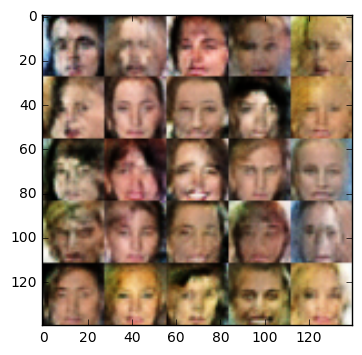

Epoch: 0 / Discriminator loss: 1.21185 / Generator loss: 0.98207
Epoch: 0 / Discriminator loss: 1.31014 / Generator loss: 0.758749
Epoch: 0 / Discriminator loss: 1.23835 / Generator loss: 0.81026
Epoch: 0 / Discriminator loss: 1.0271 / Generator loss: 0.990241
Epoch: 0 / Discriminator loss: 1.38099 / Generator loss: 0.973521
Epoch: 0 / Discriminator loss: 1.51662 / Generator loss: 0.592711
Epoch: 0 / Discriminator loss: 1.22905 / Generator loss: 0.945993
Epoch: 0 / Discriminator loss: 1.30572 / Generator loss: 1.01802
Epoch: 0 / Discriminator loss: 1.34383 / Generator loss: 0.687006
Epoch: 0 / Discriminator loss: 1.51544 / Generator loss: 0.465955


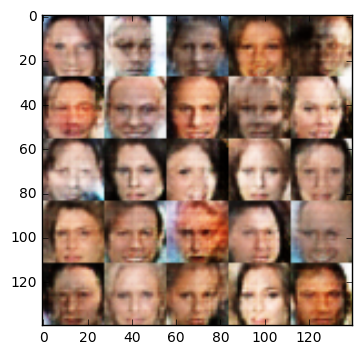

Epoch: 0 / Discriminator loss: 1.54022 / Generator loss: 0.51005
Epoch: 0 / Discriminator loss: 1.39435 / Generator loss: 0.678916
Epoch: 0 / Discriminator loss: 1.10748 / Generator loss: 0.939701
Epoch: 0 / Discriminator loss: 1.3653 / Generator loss: 0.549705
Epoch: 0 / Discriminator loss: 1.3327 / Generator loss: 0.822663
Epoch: 0 / Discriminator loss: 1.36356 / Generator loss: 0.700863
Epoch: 0 / Discriminator loss: 1.58068 / Generator loss: 0.473584
Epoch: 0 / Discriminator loss: 1.0132 / Generator loss: 1.1592
Epoch: 0 / Discriminator loss: 1.58471 / Generator loss: 0.47114
Epoch: 0 / Discriminator loss: 1.12312 / Generator loss: 1.07272


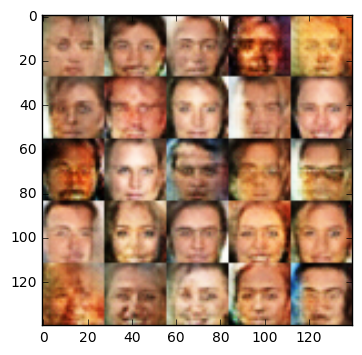

Epoch: 0 / Discriminator loss: 1.13339 / Generator loss: 1.05829
Epoch: 0 / Discriminator loss: 1.2587 / Generator loss: 0.641116
Epoch: 0 / Discriminator loss: 1.17692 / Generator loss: 0.96626
Epoch: 0 / Discriminator loss: 1.24412 / Generator loss: 0.767681
Epoch: 0 / Discriminator loss: 1.33531 / Generator loss: 0.819872
Epoch: 0 / Discriminator loss: 1.24853 / Generator loss: 0.966235
Epoch: 0 / Discriminator loss: 1.24437 / Generator loss: 1.00747
Epoch: 0 / Discriminator loss: 1.29569 / Generator loss: 1.12034
Epoch: 0 / Discriminator loss: 1.52202 / Generator loss: 0.812942
Epoch: 0 / Discriminator loss: 1.77922 / Generator loss: 0.427917


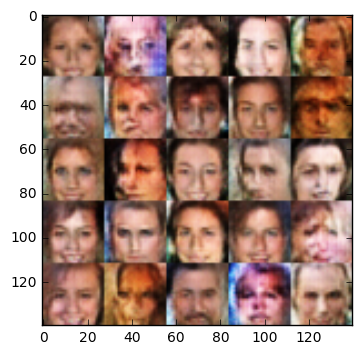

Epoch: 0 / Discriminator loss: 1.27755 / Generator loss: 0.902131
Epoch: 0 / Discriminator loss: 1.22214 / Generator loss: 0.761906
Epoch: 0 / Discriminator loss: 1.40019 / Generator loss: 0.723626
Epoch: 0 / Discriminator loss: 1.20537 / Generator loss: 1.28505
Epoch: 0 / Discriminator loss: 1.21566 / Generator loss: 0.773112
Epoch: 0 / Discriminator loss: 1.36414 / Generator loss: 1.27401
Epoch: 0 / Discriminator loss: 1.43462 / Generator loss: 0.484051
Epoch: 0 / Discriminator loss: 1.04717 / Generator loss: 1.09207
Epoch: 0 / Discriminator loss: 1.34074 / Generator loss: 0.751555
Epoch: 0 / Discriminator loss: 1.18699 / Generator loss: 0.778677


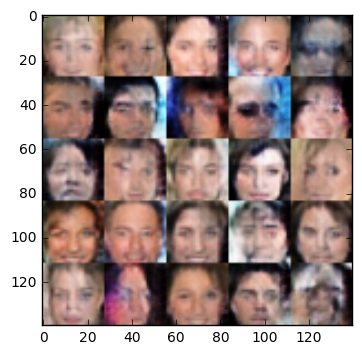

Epoch: 0 / Discriminator loss: 0.702746 / Generator loss: 2.05223
Epoch: 0 / Discriminator loss: 1.1547 / Generator loss: 0.824372
Epoch: 0 / Discriminator loss: 1.16251 / Generator loss: 0.691842
Epoch: 0 / Discriminator loss: 1.27625 / Generator loss: 0.795513
Epoch: 0 / Discriminator loss: 1.61223 / Generator loss: 0.678979
Epoch: 0 / Discriminator loss: 1.29284 / Generator loss: 1.06298
Epoch: 0 / Discriminator loss: 1.15304 / Generator loss: 1.43799
Epoch: 0 / Discriminator loss: 1.16229 / Generator loss: 1.12339
Epoch: 0 / Discriminator loss: 1.48185 / Generator loss: 0.488938
Epoch: 0 / Discriminator loss: 1.44435 / Generator loss: 0.511844


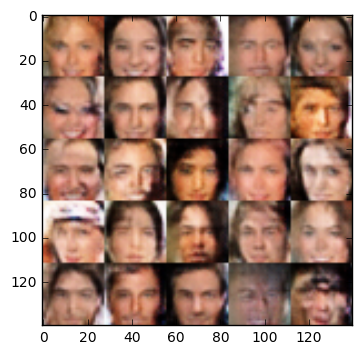

Epoch: 0 / Discriminator loss: 1.52401 / Generator loss: 0.600234
Epoch: 0 / Discriminator loss: 1.60938 / Generator loss: 0.59012
Epoch: 0 / Discriminator loss: 1.31409 / Generator loss: 0.962219
Epoch: 0 / Discriminator loss: 1.48248 / Generator loss: 0.541069
Epoch: 0 / Discriminator loss: 1.56168 / Generator loss: 0.865239
Epoch: 0 / Discriminator loss: 1.39383 / Generator loss: 0.920371
Epoch: 0 / Discriminator loss: 1.43962 / Generator loss: 0.676463
Epoch: 0 / Discriminator loss: 1.20014 / Generator loss: 0.939249
Epoch: 0 / Discriminator loss: 1.28256 / Generator loss: 0.762002
Epoch: 0 / Discriminator loss: 1.54322 / Generator loss: 0.447419


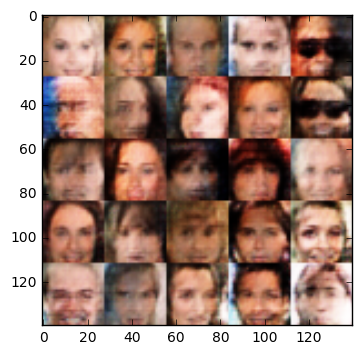

Epoch: 0 / Discriminator loss: 1.24723 / Generator loss: 0.984823
Epoch: 0 / Discriminator loss: 1.00605 / Generator loss: 1.58689
Epoch: 0 / Discriminator loss: 2.17964 / Generator loss: 0.201418
Epoch: 0 / Discriminator loss: 1.61155 / Generator loss: 0.409323
Epoch: 0 / Discriminator loss: 1.21033 / Generator loss: 0.671182
Epoch: 0 / Discriminator loss: 1.82685 / Generator loss: 0.330828
Epoch: 0 / Discriminator loss: 1.29248 / Generator loss: 0.682098
Epoch: 0 / Discriminator loss: 1.44968 / Generator loss: 0.81427
Epoch: 0 / Discriminator loss: 1.78106 / Generator loss: 0.296597
Epoch: 0 / Discriminator loss: 1.40498 / Generator loss: 0.572266


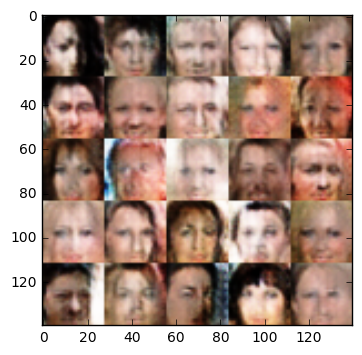

Epoch: 0 / Discriminator loss: 1.30557 / Generator loss: 0.706045
Epoch: 0 / Discriminator loss: 1.40316 / Generator loss: 0.816983
Epoch: 0 / Discriminator loss: 0.810945 / Generator loss: 1.46323
Epoch: 0 / Discriminator loss: 1.08847 / Generator loss: 1.32369
Epoch: 0 / Discriminator loss: 1.50109 / Generator loss: 0.466428
Epoch: 0 / Discriminator loss: 1.51174 / Generator loss: 0.469559
Epoch: 0 / Discriminator loss: 1.19483 / Generator loss: 0.72727
Epoch: 0 / Discriminator loss: 1.08302 / Generator loss: 0.81265
Epoch: 0 / Discriminator loss: 1.64336 / Generator loss: 0.383747
Epoch: 0 / Discriminator loss: 1.02861 / Generator loss: 0.983527


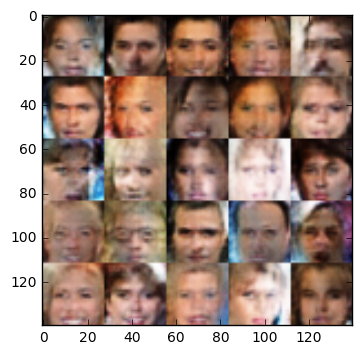

Epoch: 0 / Discriminator loss: 1.17435 / Generator loss: 1.10059
Epoch: 0 / Discriminator loss: 1.47916 / Generator loss: 0.461681
Epoch: 0 / Discriminator loss: 1.38403 / Generator loss: 0.565138
Epoch: 0 / Discriminator loss: 0.920599 / Generator loss: 1.05288
Epoch: 0 / Discriminator loss: 1.66247 / Generator loss: 0.533063
Epoch: 0 / Discriminator loss: 1.29068 / Generator loss: 0.763533
Epoch: 0 / Discriminator loss: 1.04542 / Generator loss: 1.25505
Epoch: 0 / Discriminator loss: 0.91712 / Generator loss: 1.21805
Epoch: 0 / Discriminator loss: 1.12816 / Generator loss: 0.866389
Epoch: 0 / Discriminator loss: 1.08609 / Generator loss: 0.966976


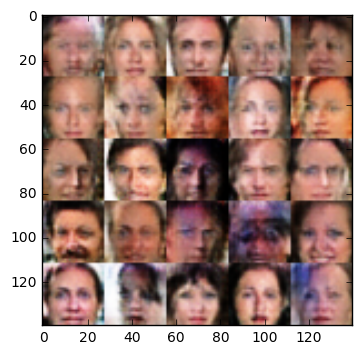

Epoch: 0 / Discriminator loss: 1.09256 / Generator loss: 1.49662
Epoch: 0 / Discriminator loss: 1.41565 / Generator loss: 0.729505
Epoch: 0 / Discriminator loss: 1.55975 / Generator loss: 0.56447
Epoch: 0 / Discriminator loss: 1.26991 / Generator loss: 0.628704
Epoch: 0 / Discriminator loss: 1.8632 / Generator loss: 0.272485
Epoch: 0 / Discriminator loss: 0.877905 / Generator loss: 1.95966
Epoch: 0 / Discriminator loss: 0.795437 / Generator loss: 1.97695
Epoch: 0 / Discriminator loss: 0.644306 / Generator loss: 2.66927
Epoch: 0 / Discriminator loss: 1.53049 / Generator loss: 0.479571
Epoch: 0 / Discriminator loss: 0.662062 / Generator loss: 1.49821


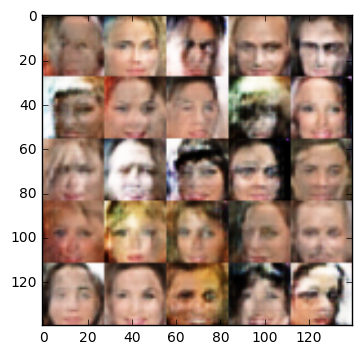

Epoch: 0 / Discriminator loss: 0.879671 / Generator loss: 1.69102
Epoch: 0 / Discriminator loss: 1.27329 / Generator loss: 1.12455
Epoch: 0 / Discriminator loss: 1.36422 / Generator loss: 0.504027
Epoch: 0 / Discriminator loss: 0.882177 / Generator loss: 1.2166
Epoch: 0 / Discriminator loss: 1.01382 / Generator loss: 1.87954
Epoch: 0 / Discriminator loss: 1.40983 / Generator loss: 0.490139
Epoch: 0 / Discriminator loss: 1.49433 / Generator loss: 0.426439
Epoch: 0 / Discriminator loss: 0.910463 / Generator loss: 1.11086
Epoch: 0 / Discriminator loss: 0.902365 / Generator loss: 1.15411
Epoch: 0 / Discriminator loss: 0.987245 / Generator loss: 0.920249


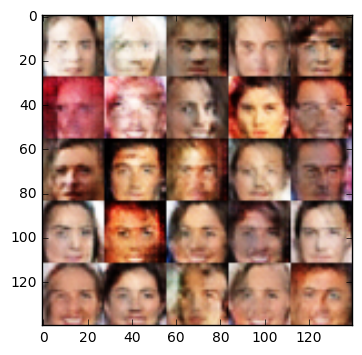

Epoch: 0 / Discriminator loss: 0.763498 / Generator loss: 1.38986
Epoch: 0 / Discriminator loss: 1.60028 / Generator loss: 0.450195
Epoch: 0 / Discriminator loss: 1.11268 / Generator loss: 0.784099
Epoch: 0 / Discriminator loss: 1.59344 / Generator loss: 0.362397
Epoch: 0 / Discriminator loss: 0.999891 / Generator loss: 1.15396
Epoch: 0 / Discriminator loss: 1.91852 / Generator loss: 0.252746
Epoch: 0 / Discriminator loss: 1.26299 / Generator loss: 2.78156
Epoch: 0 / Discriminator loss: 1.37597 / Generator loss: 0.597944
Epoch: 0 / Discriminator loss: 0.76955 / Generator loss: 2.32288
Epoch: 0 / Discriminator loss: 0.989889 / Generator loss: 1.14424


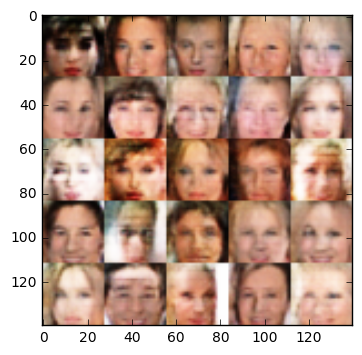

Epoch: 0 / Discriminator loss: 0.934524 / Generator loss: 0.875774
Epoch: 0 / Discriminator loss: 0.726287 / Generator loss: 2.41027
Epoch: 0 / Discriminator loss: 1.52104 / Generator loss: 0.655482
Epoch: 0 / Discriminator loss: 1.29886 / Generator loss: 0.919633
Epoch: 0 / Discriminator loss: 1.50285 / Generator loss: 0.450438
Epoch: 0 / Discriminator loss: 0.764593 / Generator loss: 3.62692
Epoch: 0 / Discriminator loss: 1.51698 / Generator loss: 0.475591
Epoch: 0 / Discriminator loss: 0.921937 / Generator loss: 1.00173
Epoch: 0 / Discriminator loss: 1.10991 / Generator loss: 0.840927
Epoch: 0 / Discriminator loss: 1.7791 / Generator loss: 0.335656


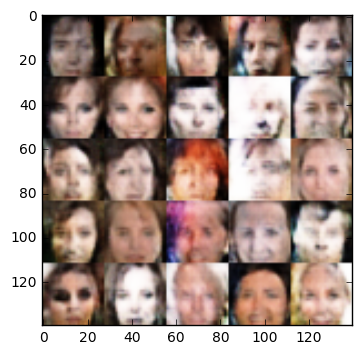

Epoch: 0 / Discriminator loss: 0.926079 / Generator loss: 1.54309
Epoch: 0 / Discriminator loss: 0.928961 / Generator loss: 1.10201
Epoch: 0 / Discriminator loss: 1.5181 / Generator loss: 0.436795
Epoch: 0 / Discriminator loss: 0.645417 / Generator loss: 1.52557
Epoch: 0 / Discriminator loss: 1.26109 / Generator loss: 1.23288
Epoch: 0 / Discriminator loss: 1.04753 / Generator loss: 1.20908
Epoch: 0 / Discriminator loss: 0.613463 / Generator loss: 2.03315
Epoch: 0 / Discriminator loss: 1.40948 / Generator loss: 0.47342
Epoch: 0 / Discriminator loss: 1.59504 / Generator loss: 0.46766
Epoch: 0 / Discriminator loss: 1.73818 / Generator loss: 0.337392


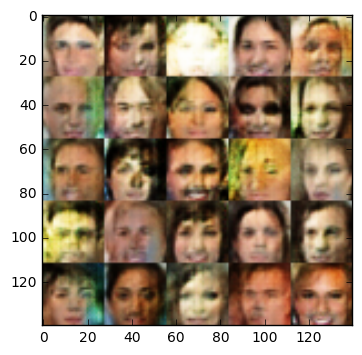

Epoch: 0 / Discriminator loss: 1.27163 / Generator loss: 0.795982
Epoch: 0 / Discriminator loss: 1.186 / Generator loss: 2.32384
Epoch: 0 / Discriminator loss: 0.70366 / Generator loss: 1.37461
Epoch: 0 / Discriminator loss: 0.945798 / Generator loss: 1.19298
Epoch: 0 / Discriminator loss: 0.917411 / Generator loss: 2.27975
Epoch: 0 / Discriminator loss: 1.55604 / Generator loss: 0.965376
Epoch: 0 / Discriminator loss: 0.711894 / Generator loss: 3.02129
Epoch: 0 / Discriminator loss: 1.05414 / Generator loss: 0.990657
Epoch: 0 / Discriminator loss: 1.39547 / Generator loss: 0.553371
Epoch: 0 / Discriminator loss: 0.755997 / Generator loss: 2.24891


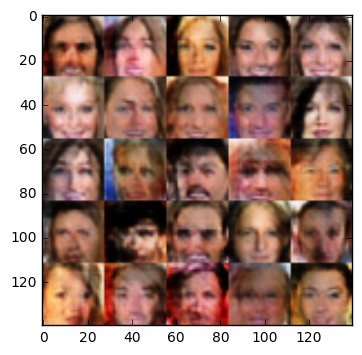

Epoch: 0 / Discriminator loss: 1.5049 / Generator loss: 0.41298
Epoch: 0 / Discriminator loss: 0.806577 / Generator loss: 3.18122
Epoch: 0 / Discriminator loss: 1.07567 / Generator loss: 1.2421
Epoch: 0 / Discriminator loss: 0.908009 / Generator loss: 1.29183
Epoch: 0 / Discriminator loss: 1.25293 / Generator loss: 1.12026
Epoch: 0 / Discriminator loss: 0.897674 / Generator loss: 1.26548
Epoch: 0 / Discriminator loss: 0.856711 / Generator loss: 1.30629
Epoch: 0 / Discriminator loss: 1.04767 / Generator loss: 1.21034
Epoch: 0 / Discriminator loss: 0.790213 / Generator loss: 5.98733
Epoch: 0 / Discriminator loss: 1.24236 / Generator loss: 0.579279


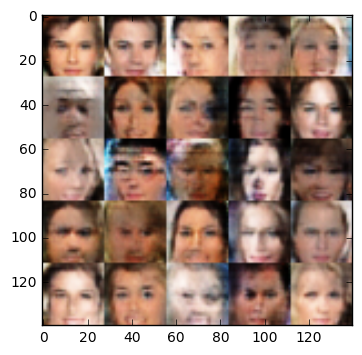

Epoch: 0 / Discriminator loss: 0.701176 / Generator loss: 2.93717
Epoch: 0 / Discriminator loss: 0.58497 / Generator loss: 2.48862
Epoch: 0 / Discriminator loss: 1.02067 / Generator loss: 2.62884
Epoch: 0 / Discriminator loss: 0.892744 / Generator loss: 1.05103
Epoch: 0 / Discriminator loss: 1.56581 / Generator loss: 0.388076
Epoch: 0 / Discriminator loss: 0.909001 / Generator loss: 1.63833
Epoch: 0 / Discriminator loss: 1.30537 / Generator loss: 0.534082
Epoch: 0 / Discriminator loss: 0.793378 / Generator loss: 1.91662
Epoch: 0 / Discriminator loss: 1.41612 / Generator loss: 1.07897
Epoch: 0 / Discriminator loss: 1.13661 / Generator loss: 1.64013


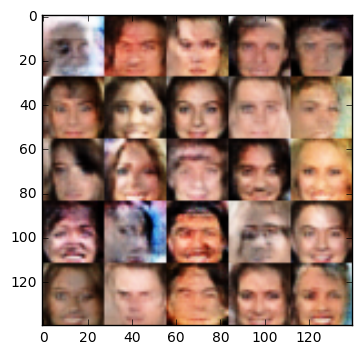

Epoch: 0 / Discriminator loss: 0.465242 / Generator loss: 3.37559
Epoch: 0 / Discriminator loss: 1.09227 / Generator loss: 0.897511
Epoch: 0 / Discriminator loss: 0.605427 / Generator loss: 3.13352
Epoch: 0 / Discriminator loss: 0.788912 / Generator loss: 2.69381
Epoch: 0 / Discriminator loss: 1.36823 / Generator loss: 0.620757
Epoch: 0 / Discriminator loss: 0.641063 / Generator loss: 1.58513
Epoch: 0 / Discriminator loss: 1.35514 / Generator loss: 0.93829
Epoch: 0 / Discriminator loss: 0.683715 / Generator loss: 1.94732
Epoch: 0 / Discriminator loss: 1.29944 / Generator loss: 1.39717
Epoch: 0 / Discriminator loss: 0.875733 / Generator loss: 1.90458


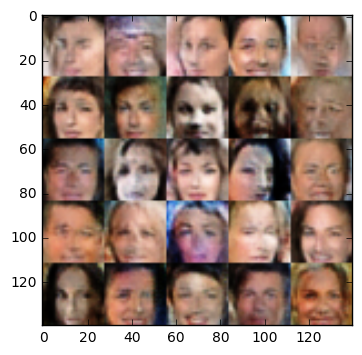

Epoch: 0 / Discriminator loss: 0.414816 / Generator loss: 3.66768
Epoch: 0 / Discriminator loss: 0.849809 / Generator loss: 1.23999
Epoch: 0 / Discriminator loss: 1.03344 / Generator loss: 3.666
Epoch: 0 / Discriminator loss: 2.16321 / Generator loss: 0.197671
Epoch: 0 / Discriminator loss: 0.622423 / Generator loss: 1.75322
Epoch: 0 / Discriminator loss: 1.14408 / Generator loss: 0.651473
Epoch: 0 / Discriminator loss: 1.4162 / Generator loss: 0.460324
Epoch: 0 / Discriminator loss: 0.626562 / Generator loss: 3.65331
Epoch: 0 / Discriminator loss: 0.85037 / Generator loss: 2.07154
Epoch: 0 / Discriminator loss: 0.502036 / Generator loss: 4.08264


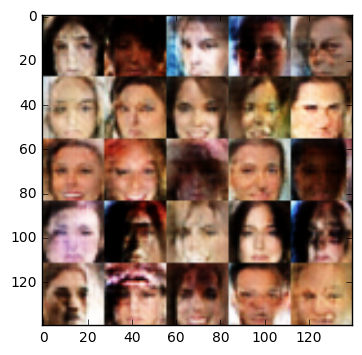

Epoch: 0 / Discriminator loss: 1.65879 / Generator loss: 0.340483
Epoch: 0 / Discriminator loss: 0.717268 / Generator loss: 1.31307
Epoch: 0 / Discriminator loss: 0.399863 / Generator loss: 2.94398
Epoch: 0 / Discriminator loss: 0.593771 / Generator loss: 1.60348
Epoch: 0 / Discriminator loss: 1.3928 / Generator loss: 0.489664
Epoch: 0 / Discriminator loss: 1.03799 / Generator loss: 2.86569
Epoch: 0 / Discriminator loss: 1.58261 / Generator loss: 0.366193
Epoch: 0 / Discriminator loss: 0.934694 / Generator loss: 2.36307
Epoch: 0 / Discriminator loss: 1.58293 / Generator loss: 0.436541
Epoch: 0 / Discriminator loss: 0.703556 / Generator loss: 1.64804


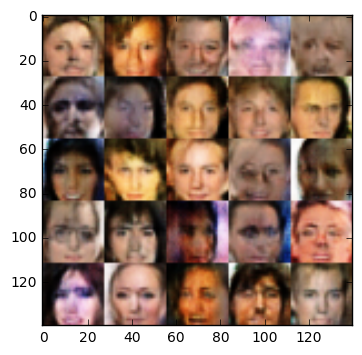

Epoch: 0 / Discriminator loss: 0.632214 / Generator loss: 1.47158
Epoch: 0 / Discriminator loss: 1.32057 / Generator loss: 0.561701
Epoch: 0 / Discriminator loss: 1.03277 / Generator loss: 3.00017
Epoch: 0 / Discriminator loss: 0.644559 / Generator loss: 1.98125
Epoch: 0 / Discriminator loss: 0.436641 / Generator loss: 3.22313
Epoch: 0 / Discriminator loss: 0.875735 / Generator loss: 0.927636
Epoch: 0 / Discriminator loss: 0.929552 / Generator loss: 2.18488
Epoch: 0 / Discriminator loss: 1.65731 / Generator loss: 1.62401
Epoch: 0 / Discriminator loss: 1.33491 / Generator loss: 0.538721
Epoch: 0 / Discriminator loss: 1.17906 / Generator loss: 0.6355


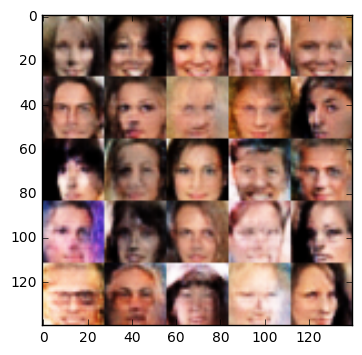

Epoch: 0 / Discriminator loss: 0.465889 / Generator loss: 7.52815
Epoch: 0 / Discriminator loss: 1.48794 / Generator loss: 0.43307
Epoch: 0 / Discriminator loss: 0.392643 / Generator loss: 3.7936


In [106]:
batch_size = 32
z_dim = 100
learning_rate = 0.0002
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.